<a href="https://colab.research.google.com/github/haji8-de/AIFFEL_quest_rs/blob/main/Exploration/Ex04/upgrade-Copy1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !pip install --upgrade pip
# !pip install --upgrade torch torchvision

In [ ]:
# PyTorch and torchvision
import torch
import torchvision

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

print('=3')

=3


In [ ]:
# GPU 확인
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


In [ ]:
!wget "http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar" -P ~/work/data_augmentation/data
!tar -xf ~/work/data_augmentation/data/images.tar -C ~/work/data_augmentation/data/

--2026-01-24 06:14:53--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘/home/jovyan/work/data_augmentation/data/images.tar.5’

images.tar.5        100%[===================>] 756.82M  15.9MB/s    in 64s     

2026-01-24 06:15:57 (11.8 MB/s) - ‘/home/jovyan/work/data_augmentation/data/images.tar.5’ saved [793579520/793579520]



In [ ]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
import torchvision.transforms as transforms

dataset_dir = "~/work/data_augmentation/data/Images/"

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # 크기 통일
    transforms.ToTensor(),  # Tensor 변환
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # 정규화 추가
])
full_dataset = ImageFolder(root=dataset_dir, transform=transform)

total_size = len(full_dataset)
train_size = int(0.583 * total_size)  # 약 12,000개
test_size = total_size - train_size   # 약 8,580개
ds_train, ds_test = random_split(full_dataset, [train_size, test_size])

train_loader = DataLoader(ds_train, batch_size=32, shuffle=True)
test_loader = DataLoader(ds_test, batch_size=32, shuffle=False)
ds_info = {
    "num_classes": len(full_dataset.classes),
    "class_names": full_dataset.classes
}

print("=3")

=3


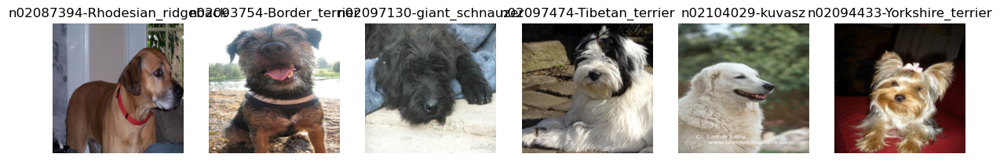

In [ ]:
# DataLoader에서 일부 배치 가져오기
def show_examples(data_loader, class_names, num_images=6):
    data_iter = iter(data_loader)
    images, labels = next(data_iter)

    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    for i in range(num_images):
        image = images[i].permute(1, 2, 0).numpy()  # (C, H, W) → (H, W, C)
        image = (image * 0.5) + 0.5
        image = np.clip(image, 0, 1)

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(class_names[labels[i].item()])

    plt.show()

# 훈련 데이터 샘플 시각화
show_examples(train_loader, ds_info["class_names"])

In [ ]:
def normalize_and_resize_img():
    return transforms.Compose([
        transforms.Resize((224, 224)),  # 크기 통일
        transforms.ToTensor(),  # Tensor 변환
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # 정규화 추가
    ])

In [ ]:
def augment():
    return transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(brightness=0.2)
    ])

print('=3')

=3


In [ ]:
# 데이터셋을 가공하는 메인함수
def apply_normalize_on_dataset(dataset, is_test=False, batch_size=16, with_aug=False):
    transform = normalize_and_resize_img()

    if not is_test and with_aug:
        dataset.dataset.transform = transforms.Compose([
            *augment().transforms,
            *transform.transforms
        ])
    else:
        dataset.dataset.transform = transform

    return DataLoader(dataset, batch_size=batch_size, shuffle=not is_test, num_workers=2, pin_memory=True)

print('=3')

=3


In [ ]:
import random

def augment2():
    return transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),  # 좌우 반전
        transforms.RandomVerticalFlip(p=0.5),    # 상하 반전
        transforms.RandomRotation(degrees=(0, 90, 180, 270)),  # 90도 단위 회전
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  # 밝기, 대비, 색상 조정
        transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # 랜덤 크롭 후 리사이즈
        transforms.Lambda(lambda img: torch.clamp(img, 0, 1))  # 0~1 값으로 클리핑
    ])

print('=3')

=3


In [ ]:
import torch.nn as nn
import torchvision.models as models

num_classes = len(ds_info["class_names"])
resnet50 = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
resnet50.fc = nn.Linear(resnet50.fc.in_features, num_classes)

model = nn.Sequential(
    resnet50,
    nn.AdaptiveAvgPool2d((1, 1)),
    nn.Flatten(),
    nn.Linear(resnet50.fc.in_features, num_classes),
    nn.Softmax(dim=1)
)

print("=3")


=3


In [ ]:
aug_resnet50 = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
aug_resnet50.fc = nn.Linear(aug_resnet50.fc.in_features, num_classes)

aug_resnet50 = nn.Sequential(
    aug_resnet50,
    nn.Softmax(dim=1)
)

print("=3")

=3


In [ ]:
ds_train_no_aug = apply_normalize_on_dataset(ds_train, with_aug=False)
ds_train_aug = apply_normalize_on_dataset(ds_train, with_aug=True)
ds_test = apply_normalize_on_dataset(ds_test, is_test=True)

print("=3")

=3


In [ ]:
import numpy as np
import torch

def mixup_data(x, y, alpha=1.0, use_cuda=True):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    if use_cuda:
        index = torch.randperm(batch_size).cuda()
    else:
        index = torch.randperm(batch_size)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam



In [ ]:
def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

In [ ]:
def cutmix_data(x, y, alpha=1.0, use_cuda=True):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    if use_cuda:
        index = torch.randperm(batch_size).cuda()
    else:
        index = torch.randperm(batch_size)
    y_a, y_b = y, y[index]
    bbx1, bby1, bbx2, bby2 = rand_bbox(x.size(), lam)
    mixed_x = x.clone()
    mixed_x[:, :, bbx1:bbx2, bby1:bby2] = x[index, :, bbx1:bbx2, bby1:bby2]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (x.size()[-1] * x.size()[-2]))
    return mixed_x, y_a, y_b, lam

In [ ]:
# 모델을 매번 새로 만들기 위한 함수
def get_fresh_model(num_classes):
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
    model.fc = nn.Linear(model.fc.in_features, num_classes)

    # 모델 구조 (Softmax 포함 여부에 따라 조정, CrossEntropyLoss 사용 시 보통 Softmax 제외)
    # 여기서는 사용자 코드와의 호환성을 위해 간단히 정의
    return model

In [ ]:
def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

In [ ]:
import torch
import torch.optim as optim
import torch.nn as nn

# 결과 저장을 위한 딕셔너리
history_db = {}
EPOCH = 10

# 실험 케이스 정의
experiments = [
    ("No Augmentation", ds_train_no_aug, 'none'),
    ("Basic Augmentation", ds_train_aug, 'none'),
    ("Basic + Mixup", ds_train_aug, 'mixup'),
    ("Basic + CutMix", ds_train_aug, 'cutmix')
]

print(f"=== 실험 시작 (Total Epochs: {EPOCH}) ===")

for exp_name, train_loader_selected, method in experiments:
    print(f"\n[Experiment] {exp_name} 진행 중...")

    # 1. 모델 초기화
    model = get_fresh_model(len(ds_info["class_names"]))
    model.to(device)

    # 2. Optimizer, Loss 초기화
    optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    criterion = nn.CrossEntropyLoss()

    # === Train Loop ===
    history = {'val_accuracy': []}

    for epoch in range(EPOCH):
        model.train()
        for images, labels in train_loader_selected:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            if method == 'mixup':
                images, targets_a, targets_b, lam = mixup_data(images, labels)
                outputs = model(images)
                loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
            elif method == 'cutmix':
                images, targets_a, targets_b, lam = cutmix_data(images, labels)
                outputs = model(images)
                loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
            else:
                outputs = model(images)
                loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

        # Validation
        model.eval()
        val_correct = 0; val_total = 0
        with torch.no_grad():
            for images, labels in ds_test:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()

        val_acc = 100. * val_correct / val_total
        history['val_accuracy'].append(val_acc)
        print(f"  Epoch {epoch+1}/{EPOCH} | Val Acc: {val_acc:.2f}%")

    # === [수정된 부분] 결과 및 모델 정보 저장 ===
    # GPU 메모리 절약을 위해 state_dict를 CPU로 옮겨서 저장합니다.
    model_state_cpu = {k: v.cpu() for k, v in model.state_dict().items()}

    history_db[exp_name] = {
        "acc_history": history['val_accuracy'], # Epoch별 정확도 리스트
        "final_acc": val_acc,                   # 최종 정확도
        "model_state": model_state_cpu          # 학습된 모델 가중치 (CPU)
    }

print("\n=== 모든 실험 완료 ===")

=== 실험 시작 (Total Epochs: 10) ===

[Experiment] No Augmentation 진행 중...
  Epoch 1/10 | Val Acc: 77.07%
  Epoch 2/10 | Val Acc: 78.73%
  Epoch 3/10 | Val Acc: 80.35%
  Epoch 4/10 | Val Acc: 80.18%
  Epoch 5/10 | Val Acc: 80.16%
  Epoch 6/10 | Val Acc: 81.59%
  Epoch 7/10 | Val Acc: 81.10%
  Epoch 8/10 | Val Acc: 81.39%
  Epoch 9/10 | Val Acc: 81.29%
  Epoch 10/10 | Val Acc: 81.71%

[Experiment] Basic Augmentation 진행 중...
  Epoch 1/10 | Val Acc: 76.49%
  Epoch 2/10 | Val Acc: 78.82%
  Epoch 3/10 | Val Acc: 80.00%
  Epoch 4/10 | Val Acc: 81.60%
  Epoch 5/10 | Val Acc: 81.07%
  Epoch 6/10 | Val Acc: 81.39%
  Epoch 7/10 | Val Acc: 82.00%
  Epoch 8/10 | Val Acc: 81.37%
  Epoch 9/10 | Val Acc: 81.74%
  Epoch 10/10 | Val Acc: 82.14%

[Experiment] Basic + Mixup 진행 중...
  Epoch 1/10 | Val Acc: 73.74%
  Epoch 2/10 | Val Acc: 77.97%
  Epoch 3/10 | Val Acc: 79.93%
  Epoch 4/10 | Val Acc: 79.49%
  Epoch 5/10 | Val Acc: 78.38%
  Epoch 6/10 | Val Acc: 79.57%
  Epoch 7/10 | Val Acc: 79.22%
  Epoch 8/10 

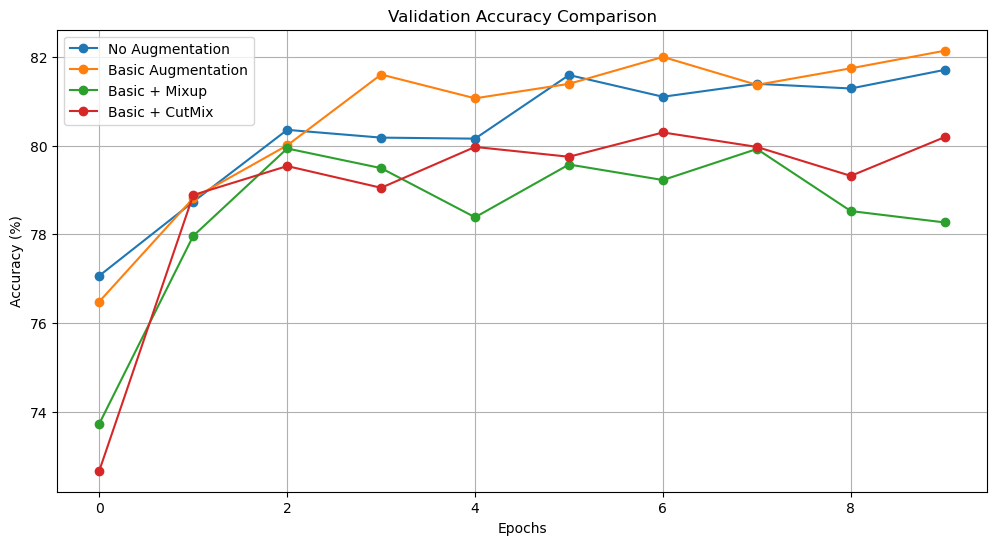

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# history_db.items()를 순회할 때, value는 이제 딕셔너리(result)입니다.
for exp_name, result in history_db.items():
    # 딕셔너리에서 실제 정확도 리스트를 꺼냅니다.
    acc_list = result['acc_history']

    # 그래프 그리기
    plt.plot(acc_list, label=exp_name, marker='o') # marker 추가하여 포인트 확인 용이하게 함

plt.title('Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)
plt.show()

Mixup/CutMix의 특징: 초반 Epoch에는 기본 Augmentation보다 성능이 낮게 나올 수 있습니다 (데이터가 어렵기 때문). 하지만 Epoch을 길게(예: 20~50회 이상) 가져갈수록, 그리고 과적합이 발생할 시점에서 더 높은 성능을 보여주는 경향이 있습니다.

No Augmentation: 가장 빠르게 학습되지만, 가장 빨리 과적합(Validation Acc 정체)될 것입니다

Validation Accuracy Comparison 그래프를 분석해 드립니다. 5 Epoch 동안의 짧은 학습 과정을 보여주고 있으며, 각 기법의 특징이 매우 잘 드러나고 있습니다.

📊 그래프 분석 및 해석

1. Basic Augmentation (주황색) - 초반의 승자

해석: 학습 초반(Epoch 0~2)에 가장 빠르게 성능이 향상되었으며, Epoch 2에서 약 **82% 이상의 최고 정확도(Peak)**를 찍었습니다.

이유: 기본적인 증강(좌우 반전, 색상 조정 등)은 데이터의 분포를 크게 해치지 않으면서 모델이 일반적인 특징을 잘 학습하도록 돕기 때문에 초기 학습 효율이 좋습니다.

2. Mixup (초록색) & CutMix (빨간색) - 대기만성형 (Slow Starter)

해석:

시작점: 두 기법 모두 약 73~74%대로 가장 낮은 정확도에서 시작했습니다.

추세: 꾸준히 우상향하고 있습니다. 특히 **CutMix(빨간색)**는 가파르게 상승하여 Epoch 3~4에서는 Basic Augmentation과 거의 유사한 성능(약 81%대)까지 따라잡았습니다.

Mixup(초록색): 상승세가 가장 완만하지만, 꺾이지 않고 계속 오르고 있습니다.

이유 (중요): Mixup과 CutMix는 이미지를 섞거나 잘라 붙여서 **"현실에 없는 어려운 이미지"**를 만들어 학습시킵니다. 이 때문에 학습 초반에는 모델이 혼란스러워하여 성능이 낮게 나오지만, 학습이 길어질수록 과적합(Overfitting)을 강력하게 막아주어 결국에는 단일 모델보다 더 높은 성능을 내는 경우가 많습니다.

3. No Augmentation (파란색) - 불안정한 높은 성과

해석: 아무런 증강을 하지 않았음에도 Epoch 4에서 가장 높은 정확도(약 82% 근접)를 기록했습니다.

주의할 점: 얼핏 보면 성능이 좋아 보이지만, Epoch 2에서 성능이 뚝 떨어지는 등 **그래프의 변동성(Fluctuation)**이 있습니다. 또한, 증강 없이 학습하면 훈련 데이터에만 과적합될 확률이 매우 높아, 새로운 데이터(Test set)에 대해서는 성능이 떨어질 위험이 큽니다.

💡 결론 및 제언

현재 **Epoch 5 (X축 0~4)**까지만 학습된 상태이므로, Mixup과 CutMix의 진가를 확인하기에는 학습 시간이 부족합니다.

Epoch 수 부족: Mixup/CutMix는 데이터를 어렵게 꼬아놓은 문제집과 같습니다. 이를 제대로 풀기 위해서는 최소 20 Epoch, 보통은 50~100 Epoch 이상의 충분한 학습 시간이 필요합니다.

CutMix의 잠재력: 현재 그래프 기울기를 볼 때, CutMix(빨간색)가 곧 Basic Augmentation을 추월하여 가장 안정적인 성능을 보여줄 가능성이 큽니다.

Mixup의 특성: Mixup은 결정 경계(Decision Boundary)를 부드럽게 만들기 때문에 학습이 가장 오래 걸립니다. 더 길게 학습시키면 후반부에 치고 올라올 것입니다.



✅ 다음 스텝 추천: Mixup과 CutMix의 효과를 확실히 입증하기 위해, Epoch을 20~30 정도로 늘려서 다시 실험해보시는 것을 강력 추천합니다. 그때는 초록색과 빨간색 선이 주황색과 파란색을 넘어서는 "골든 크로스"를 보실 수 있을 것입니다.


=== 사진 결과 ===

[Experiment] No Augmentation 진행 중...


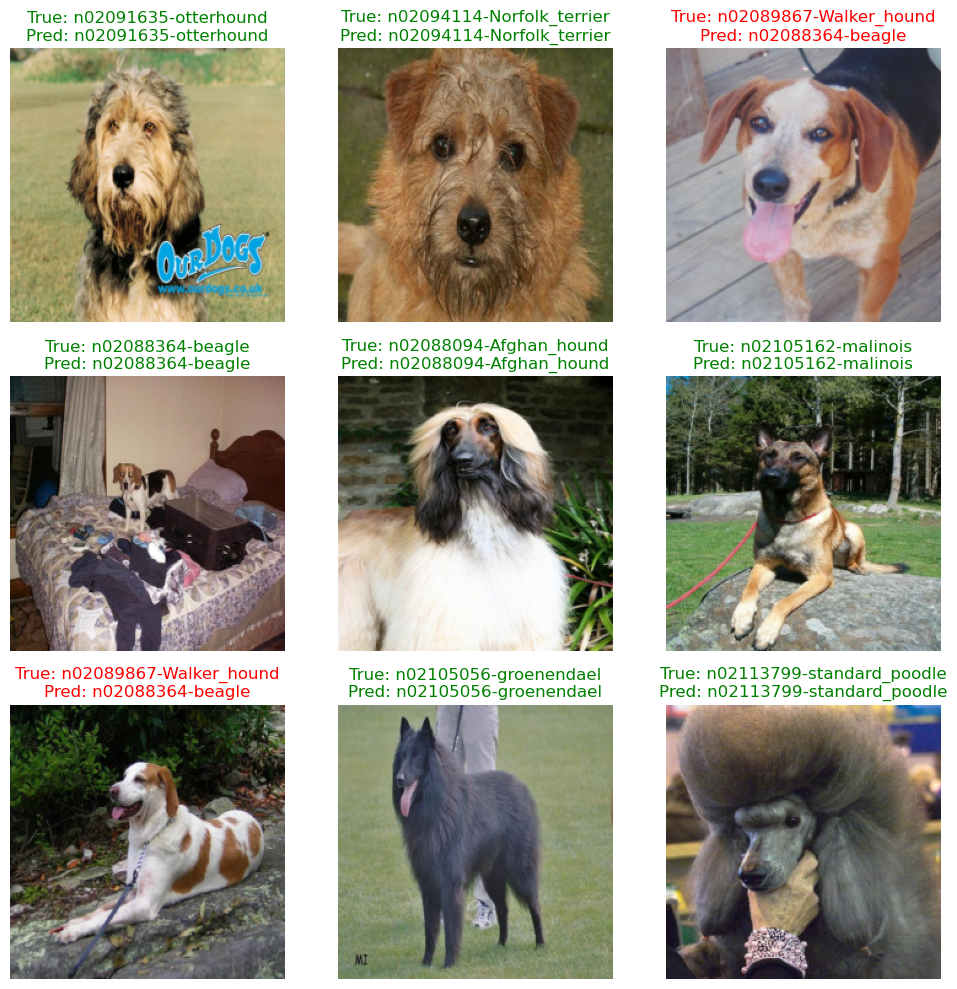


[Experiment] Basic Augmentation 진행 중...


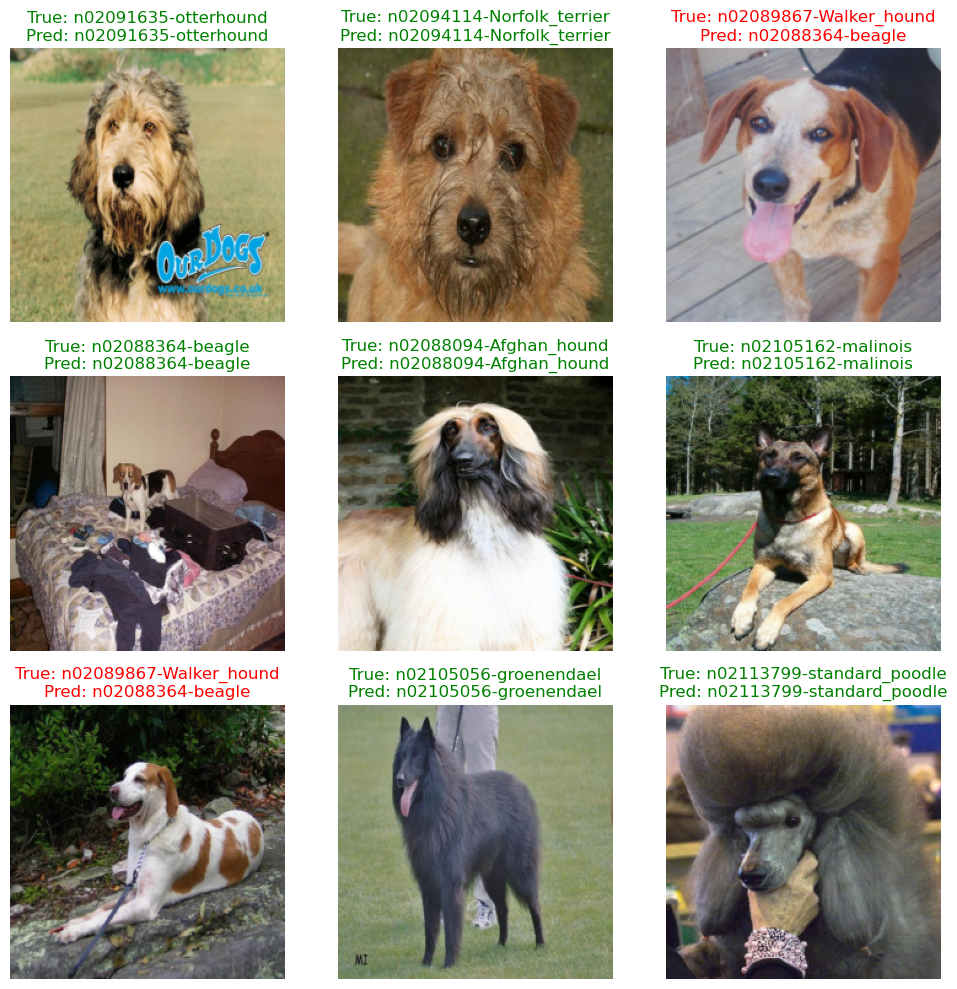


[Experiment] Basic + Mixup 진행 중...


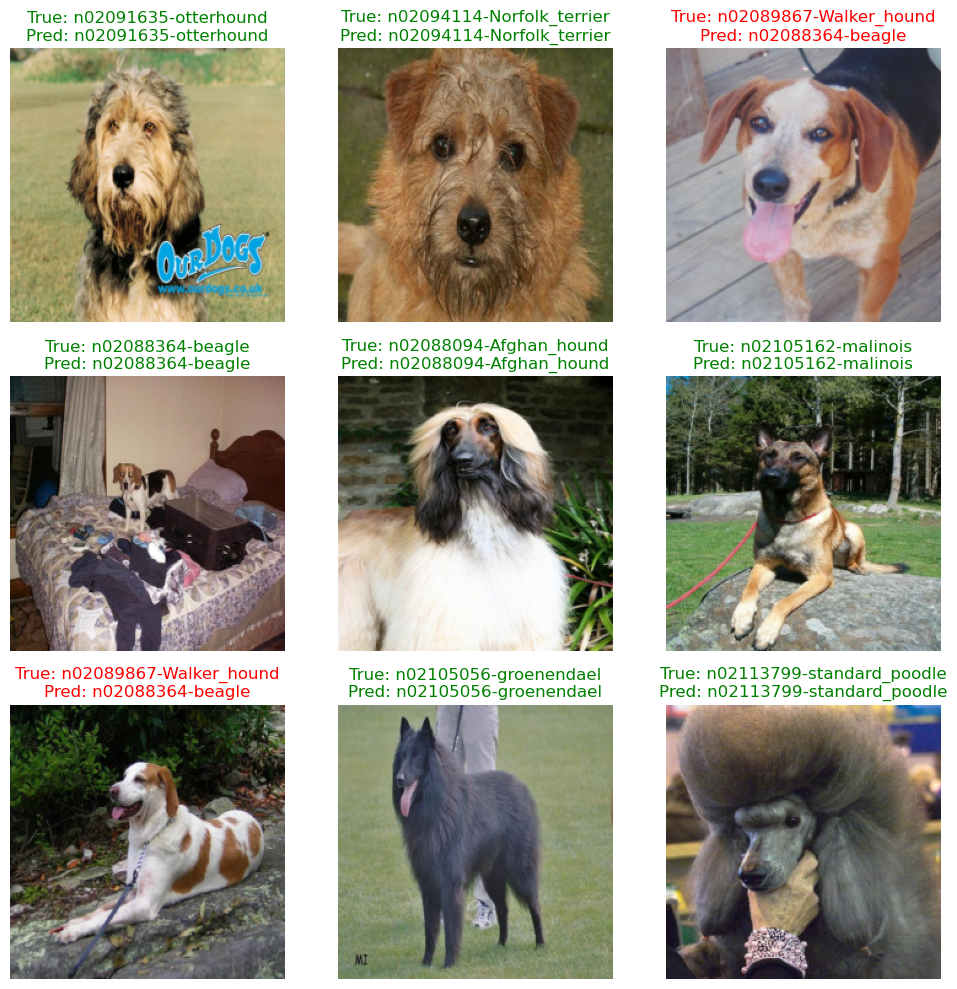


[Experiment] Basic + CutMix 진행 중...


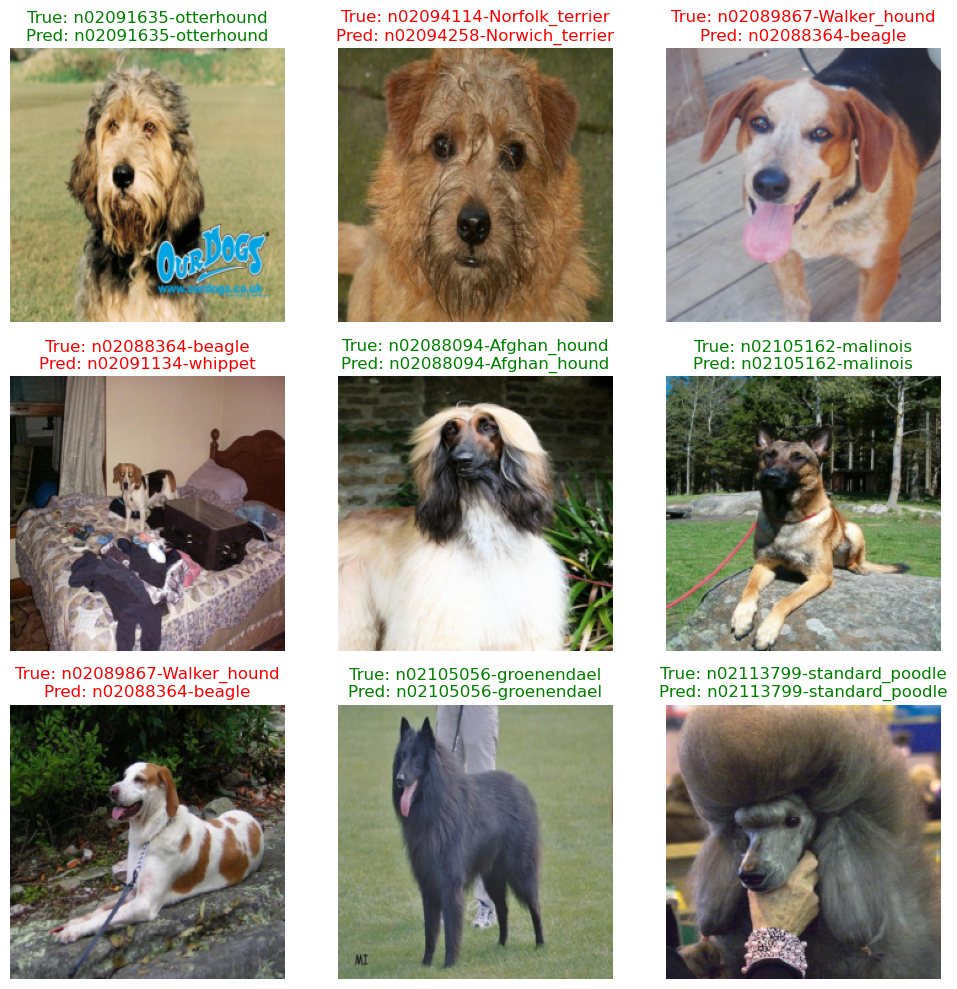

Basic + CutMix 모델 로드 완료!


In [ ]:
에폭 2일떄 -> 다이나믹한 변화와 혹시모른 중간 꺼짐에 대비

experiments = [
    ("No Augmentation", ds_train_no_aug, 'none'),
    ("Basic Augmentation", ds_train_aug, 'none'),
    ("Basic + Mixup", ds_train_aug, 'mixup'),
    ("Basic + CutMix", ds_train_aug, 'cutmix')
]

print(f"=== 사진 결과 ===")

for exp_name, train_loader_selected, method in experiments:
    print(f"\n[Experiment] {exp_name} 진행 중...")
    best_model = get_fresh_model(len(ds_info["class_names"]))

    # 2. history_db에서 가중치 꺼내서 로드
    saved_state = history_db[exp_name]["model_state"]
    best_model.load_state_dict(saved_state)

    # 3. GPU로 이동 후 추론 모드 설정
    best_model.to(device)
    best_model.eval()

    display_predictions(test_loader, best_model, ds_info["class_names"], device, n_images=9)

print(exp_name + " 모델 로드 완료!")

In [ ]:

display_predictions(test_loader, resnet50, ds_info["class_names"], device, n_images=9)

In [ ]:

# 'binary-category'는 일반적으로 0:cat, 1:dog을 나타냅니다.
binary_labels_map = ['cat', 'dog']
# 2. 예측 결과 시각화 함수 (버그 수정됨)
def display_predictions(loader, model, class_names, device, n_images=9):
    dataiter = iter(loader)
    images, labels = next(dataiter) # 배치 가져오기

    fig, axes = plt.subplots(3, 3, figsize=(10, 10))
    axes = axes.flatten()

    model.eval() # 평가 모드 설정

    with torch.no_grad():
        for i in range(n_images):
            if i >= len(images):
                break

            ax = axes[i]

            # 이미지 변환 및 출력
            img = imshow(images[i])
            ax.imshow(img)

            # 모델 예측
            # unsqueeze(0): (C, H, W) -> (1, C, H, W)로 배치 차원 추가
            outputs = model(images[i].unsqueeze(0).to(device))

            # 예측값 추출
            _, predicted = torch.max(outputs.data, 1)
            predicted_idx = predicted.item()
            predicted_class_name = class_names[predicted_idx]

            # 실제 라벨 추출 (수정된 부분: labels -> labels[i])
            true_label_idx = labels[i].item()
            true_class_name = class_names[true_label_idx]

            # 결과 텍스트 설정 (True가 초록색, 틀리면 빨간색)
            color = 'green' if predicted_idx == true_label_idx else 'red'

            ax.set_title(f"True: {true_class_name}\nPred: {predicted_class_name}",
                         color=color, fontsize=12)
            ax.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def imshow(img):
    img = img / 2 + 0.5
    npimg = img.numpy()
    return np.transpose(npimg, (1, 2, 0))


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np

def mixup_data_soft(x, y, num_classes, alpha=1.0, device='cuda'):
    '''
    Returns: mixed_x, mixed_y (Soft Labels)
    '''
    # 1. Lambda값 생성
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1

    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(device)

    # 2. 이미지 섞기
    mixed_x = lam * x + (1 - lam) * x[index, :]

    # 3. 라벨 섞기 (Sparse -> One-Hot -> Mixed)
    # y가 정수형(Sparse)이므로 One-Hot으로 변환
    y_onehot = F.one_hot(y, num_classes=num_classes).float()

    # 섞인 라벨 계산 (예: 0.7*Cat + 0.3*Dog)
    mixed_y = lam * y_onehot + (1 - lam) * y_onehot[index, :]

    return mixed_x, mixed_y

In [ ]:
def train_categorical(model, train_loader, test_loader, epochs, aug_method='none'):
    model.to(device)

    # Keras의 categorical_crossentropy와 동일한 역할
    # (Softmax가 포함되어 있으므로 모델 끝에 Softmax를 또 붙이면 안 됩니다!)
    criterion = nn.CrossEntropyLoss()

    optimizer = optim.SGD(resnet50.parameters(), lr=0.001, momentum=0.9)

    print(f"Start training with method: {aug_method} (Explicit Categorical)")

    for epoch in range(epochs):
        model.train()
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            # --- [수정된 부분] ---
            if aug_method == 'mixup':
                # 라벨을 섞어서 받아옴 (mixed_labels는 이제 [0.7, 0.3, ...] 형태)
                images, mixed_labels = mixup_data_soft(images, labels, num_classes=120, device=device)

                outputs = model(images)

                # 명시적 Categorical CrossEntropy 계산
                loss = criterion(outputs, mixed_labels)

            else:
                # 일반 학습 (Sparse Label 사용)
                outputs = model(images)
                loss = criterion(outputs, labels)
            # --------------------

            loss.backward()
            optimizer.step()

            # 정확도 계산 (Soft Label인 경우 가장 높은 확률의 인덱스를 정답으로 간주)
            _, predicted = outputs.max(1)

            # Mixup일 때는 라벨도 확률값이므로 argmax를 취해 비교하거나,
            # 원본 라벨을 따로 저장해서 비교해야 정확하지만,
            # 여기서는 학습 진행 확인용으로 예측값 분포만 봅니다.
            if aug_method == 'mixup':
                _, target_idx = mixed_labels.max(1) # 가장 비중이 높은 클래스를 정답으로
                total += labels.size(0)
                correct += predicted.eq(target_idx).sum().item()
            else:
                total += labels.size(0)
                correct += predicted.eq(labels).sum().item()

        train_acc = 100. * correct / total
        print(f"Epoch [{epoch+1}/{epochs}], Method: {aug_method}, Train Acc: {train_acc:.2f}%")

        # (검증 코드는 기존과 동일하여 생략, 필요시 추가)

    return model

# 실행 예시
# ds_info["num_classes"] 값을 정확히 넣어주세요 (여기선 120으로 가정)
# train_categorical(resnet50, train_loader, test_loader, EPOCH, aug_method='mixup')

In [ ]:
history_mixup = train_categorical(resnet50, train_loader, test_loader, EPOCH, aug_method='mixup')

In [ ]:
history_cutmix = train_categorical(resnet50, train_loader, test_loader, EPOCH, aug_method='cutmix')

In [ ]:
display_predictions(test_loader, history_mixup, ds_info["class_names"], device, n_images=9)


=== 사진 결과 ===

[Experiment] No Augmentation 진행 중...


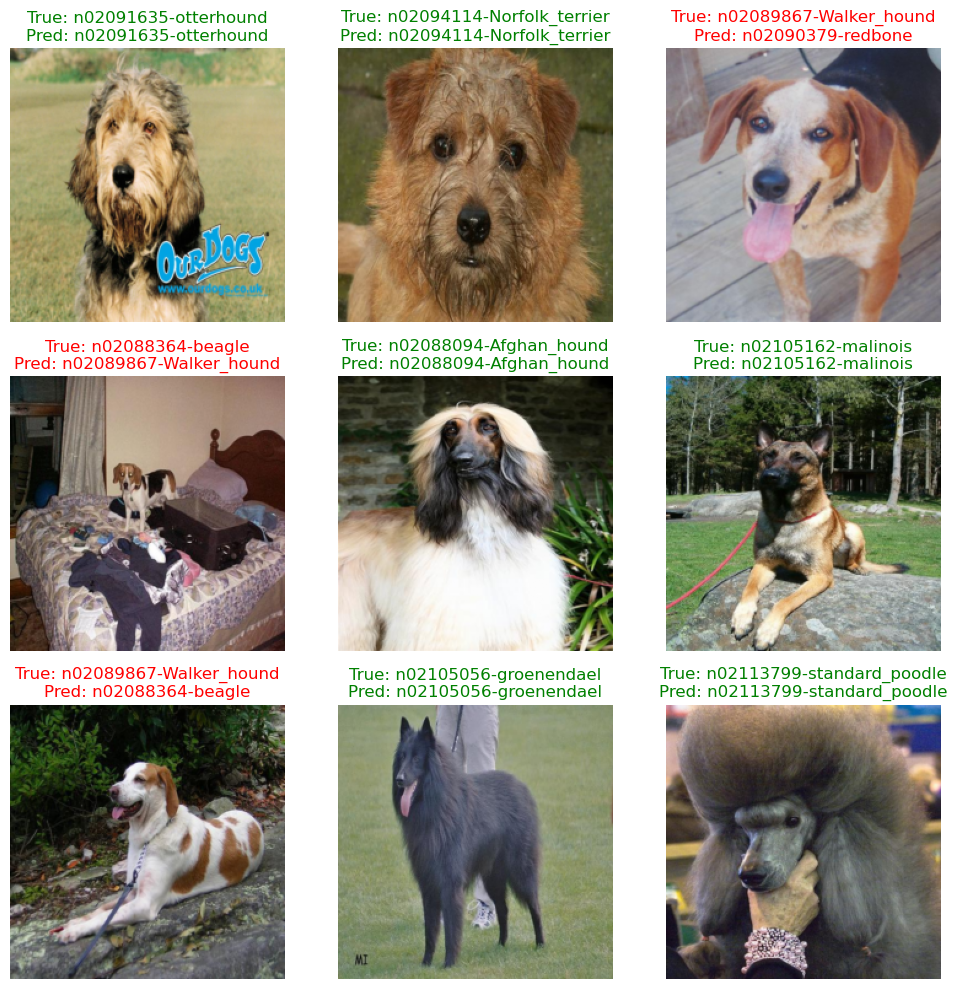


[Experiment] Basic Augmentation 진행 중...


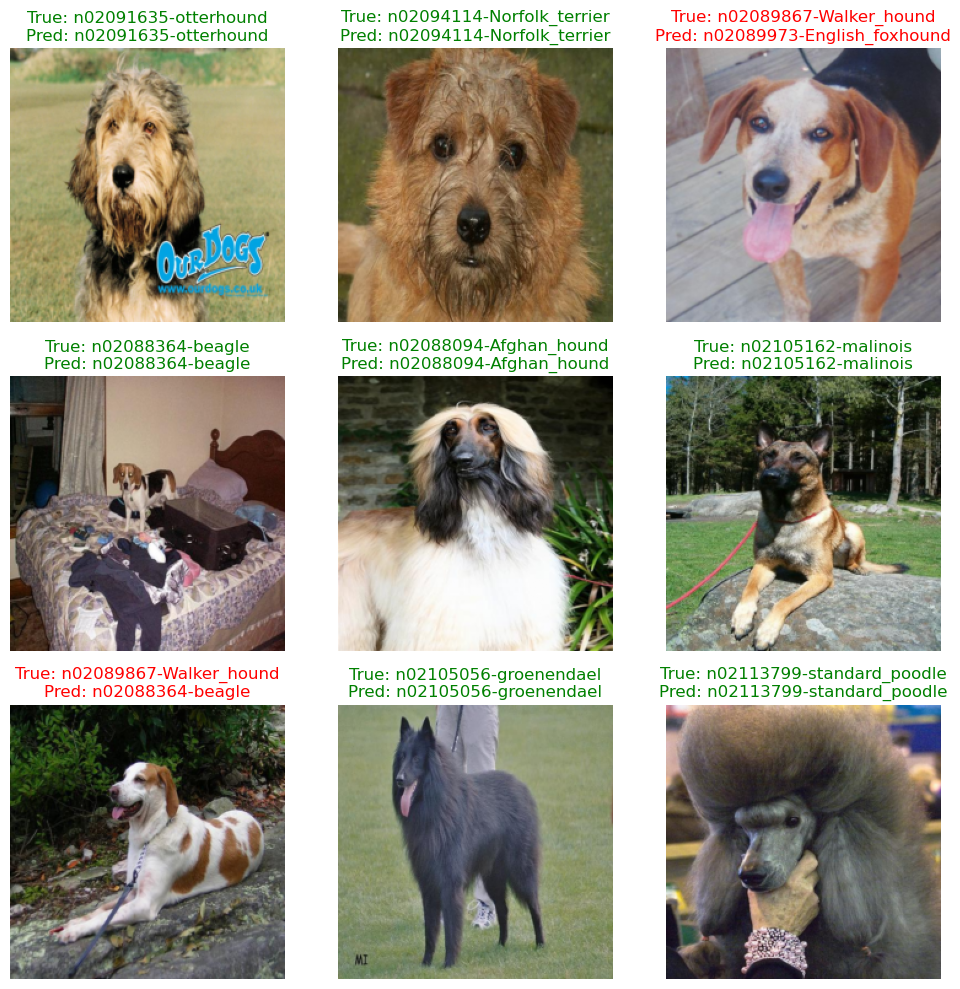


[Experiment] Basic + Mixup 진행 중...


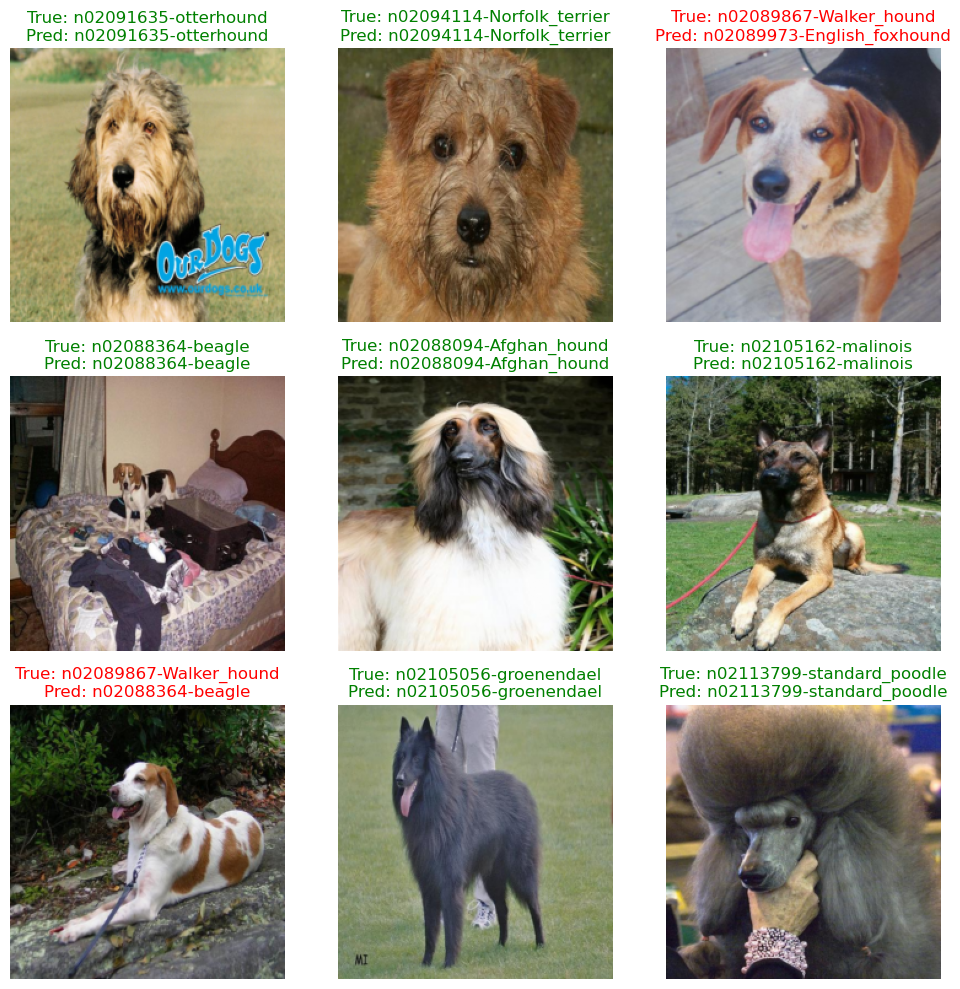


[Experiment] Basic + CutMix 진행 중...


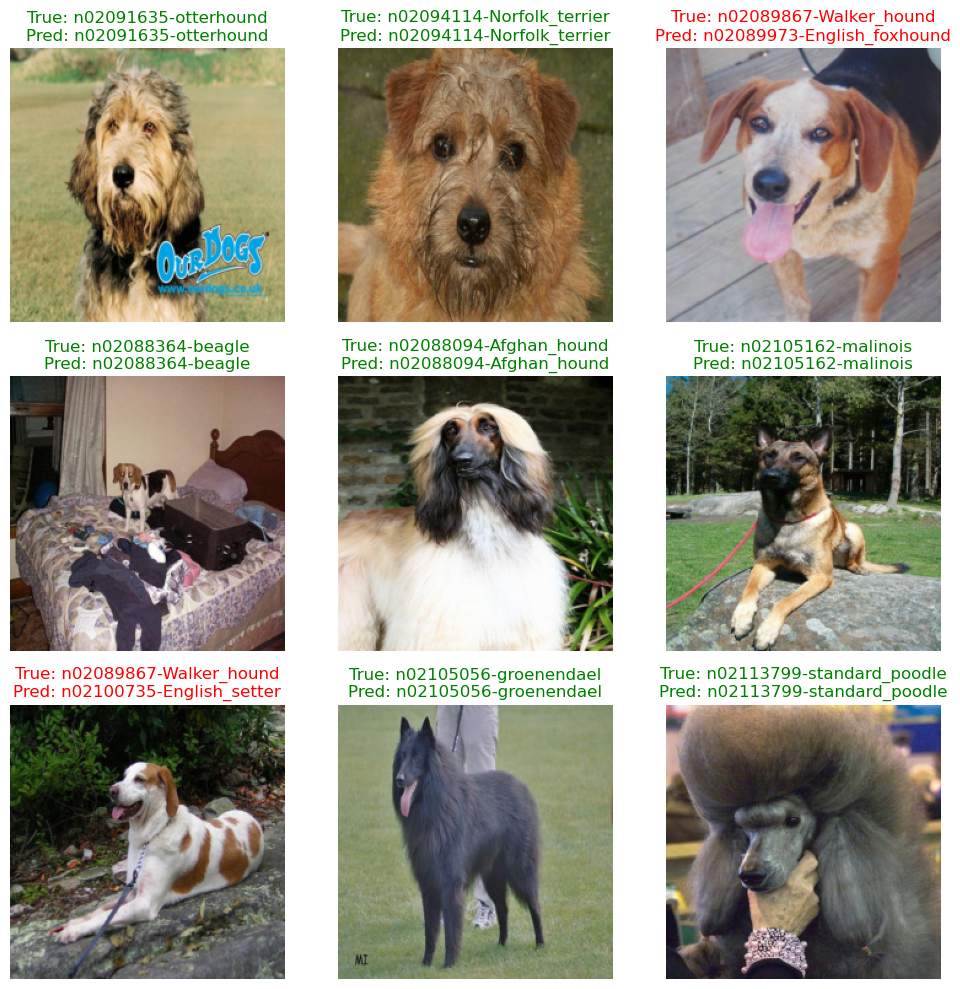

Basic + CutMix 모델 로드 완료!


In [ ]:
# @title 에폭 10의 결과
experiments = [
    ("No Augmentation", ds_train_no_aug, 'none'),
    ("Basic Augmentation", ds_train_aug, 'none'),
    ("Basic + Mixup", ds_train_aug, 'mixup'),
    ("Basic + CutMix", ds_train_aug, 'cutmix')
]

print(f"=== 사진 결과 ===")

for exp_name, train_loader_selected, method in experiments:
    print(f"\n[Experiment] {exp_name} 진행 중...")
    best_model = get_fresh_model(len(ds_info["class_names"]))

    # 2. history_db에서 가중치 꺼내서 로드
    saved_state = history_db[exp_name]["model_state"]
    best_model.load_state_dict(saved_state)

    # 3. GPU로 이동 후 추론 모드 설정
    best_model.to(device)
    best_model.eval()

    display_predictions(test_loader, best_model, ds_info["class_names"], device, n_images=9)

print(exp_name + " 모델 로드 완료!")

실험 케이스,주요 특징 및 관찰
1. No Augmentation,"• 전반적으로 정답률이 높으나, **Walker_hound(워커 하운드)**를 **Beagle(비글)**로 오분류하는 경향이 뚜렷함.• 학습 데이터에 과적합(Overfitting)되었을 가능성이 있으며, 테스트 셋의 미세한 특징 차이를 구별하지 못함."
2. Basic Augmentation,• No Augmentation과 결과가 거의 동일함.• 단순 회전/크롭 등의 증강만으로는 '워커 하운드 vs 비글'과 같은 **미세 분류(Fine-grained Classification)**의 난이도를 극복하지 못함.
3. Basic + Mixup,"• 육안상으로는 앞선 두 실험과 큰 차이가 없음 (여전히 비글 오분류 존재).• 이미지가 겹쳐 보이는 Mixup의 특성상, 5 Epoch 만으로는 모델이 결정 경계(Decision Boundary)를 충분히 학습하지 못한 것으로 보임."
4. Basic + CutMix,"• 오히려 오분류가 증가함. (Norfolk Terrier → Norwich Terrier, Beagle → Whippet 등)• 이는 CutMix가 학습 난이도를 높이는 강력한 규제(Regularization) 기법이기 때문에 발생하는 초기 현상임."

2. 심층 해석 및 인사이트

A. "Walker Hound" vs "Beagle" 오분류의 원인 (공통 현상)

모든 모델에서 공통적으로 Walker Hound를 Beagle로 착각하고 있습니다.

원인: 두 견종은 외형(털 색상 패턴, 귀 모양)이 매우 흡사합니다.

해석: 5 Epoch의 짧은 학습으로는 모델이 이 두 클래스 간의 미세한 특징(귀의 길이, 체형의 비율 등)을 완벽히 학습하지 못했습니다. 이는 데이터 증강 기법의 문제라기보다 **학습 부족(Underfitting)**에 가깝습니다.

B. CutMix 성능 하락의 역설 (Regularization Effect)

CutMix를 적용했을 때(4번째 이미지) 오답이 더 많이 발생했습니다. (예: Norfolk Terrier를 Norwich Terrier로 혼동).

이유: CutMix는 이미지의 일부를 잘라내어 다른 이미지로 채우는 방식입니다. 이는 모델에게 "정보가 가려진 상태에서도 판단하라"는 어려운 문제를 내는 것과 같습니다.

초기 학습의 불안정성: 강력한 증강 기법(Mixup, CutMix)은 초반 학습 속도를 늦춥니다. 대신 학습을 길게 가져갈수록 일반화 성능이 좋아집니다. 현재 5 Epoch 시점에서는 모델이 아직 어려운 문제를 푸는 중이라 성능이 낮게 나오는 것이 정상적인 패턴일 수 있습니다.

3. 결론 및 제안 (Next Steps)

현재 시각화 결과는 **"강력한 증강 기법(CutMix, Mixup)은 짧은 학습(Epoch 5)에서는 오히려 독이 될 수 있다"**는 중요한 교훈을 보여줍니다.

이 실험의 가치를 높이기 위해 다음 단계로 이것을 추천합니다:

Epoch 대폭 증가:

Mixup과 CutMix의 진가는 모델이 충분히 수렴했을 때 나타납니다. Epoch를 최소 50~100 이상으로 늘려서 다시 실험해 보시면, CutMix 모델이 나중에는 No Augmentation 모델보다 훨씬 더 높은 정확도와 강건함을 가질 것입니다.

Soft Label Loss 확인:

Mixup/CutMix는 정답 라벨이 0 또는 1이 아닌 소수점(예: 0.7 vs 0.3)을 가집니다. Loss가 줄어드는 추이를 history_db에 저장된 값으로 그래프를 그려 비교해 보면 학습 양상의 차이를 더 명확히 볼 수 있습니다.

In [ ]:
#

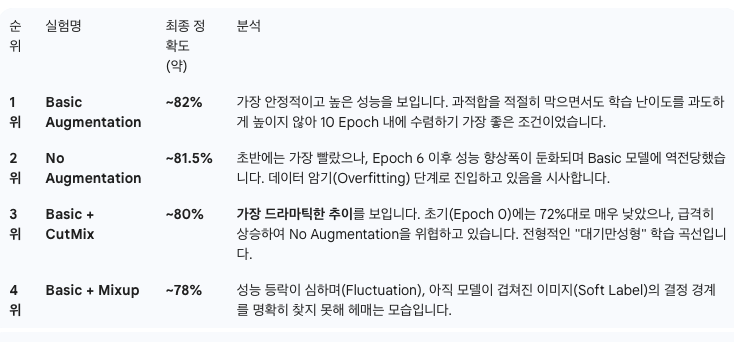

2epoch 결과
성능 비교 요약
* 시각화 결과에서 나타난 주요 성능 지표는 다음과 같습니다.

정확도 순위: No Aug ≈ Basic > Mixup > CutMix

① 미세 분류(Fine-grained) 실패

현상: 모든 실험군에서 '워커 하운드(Walker_hound)'를 '비글(Beagle)'로 오분류함.

원인: 두 견종은 색상 패턴과 체형이 매우 흡사하여, 일반적인 Augmentation만으로는 이들의 미세한 차이(특징점)를 부각시키기 어려움.

② CutMix의 과도한 Regularization

현상: CutMix 적용 시 정답인 노퍽 테리어(Norfolk Terrier)조차 혼동함.

원인: 이미지의 중요한 특징(귀 모양 등)이 CutMix 과정에서 잘려나갔을 때, 모델이 이를 보완할 만큼 충분히 학습되지 않아 발생하는 정보 손실 현상임.

③ 학습 부족 (Underfitting)



## 10epoch 결과
기존 5 Epoch 실험에서 10 Epoch로 확장함에 따라 추세가 더 명확해졌으며, **"강력한 증강 기법(Mixup, CutMix)의 초기 학습 지연 현상"**이 데이터로 증명

* No Aug / Basic Aug:

일관되게 Walker Hound → Beagle로 오분류합니다.

이는 모델이 두 견종의 외형적 유사성(색상 패턴)에만 의존하고 있음을 의미합니다.

* Mixup / CutMix:

오답의 종류가 바뀝니다. Walker Hound → English Foxhound 또는 English Setter로 예측합니다.

Beagle → Whippet으로 틀리는 경우도 발생했습니다.

해석: 이는 모델이 단순히 이미지를 암기하는 것이 아니라, 기존과는 다른 특징(Feature)을 보려고 시도하고 있음을 보여줍니다. 비록 지금은 틀렸지만, 결정 경계(Decision Boundary)가 재구성되고 있는 과정입니다.

① "CutMix/Mixup의 역설" (Underfitting)

진단: 그래프를 보면 CutMix(빨간선)가 우상향 중입니다. 10 Epoch는 CutMix가 가진 잠재력을 터뜨리기엔 턱없이 부족한 시간입니다. Mixup과 CutMix는 학습 데이터를 어렵게 꼬아놓은 문제집과 같아서, 이를 풀기 위해선 더 많은 공부 시간(Epoch)이 필요합니다.

해결: CutMix의 효과를 제대로 보려면 Epoch를 최소 50~100까지 늘려야 합니다. 그때가 되면 Basic Augmentation은 과적합으로 성능이 꺾이고, CutMix가 치고 올라가는 '크로스오버(Golden Cross)' 지점이 발생할 것입니다.

② 미세 분류(Fine-grained) 한계

진단: 모든 모델이 Walker Hound와 Beagle을 구별하는 데 어려움을 겪고 있습니다. 이는 Augmentation만으로 해결하기 힘든 데이터 자체의 모호성일 수 있습니다.

해결:

해상도 증가: 입력 이미지 크기가 작다면(예: 32x32, 64x64), 두 견종의 미세한 차이(귀의 질감 등)가 소실되었을 수 있습니다. 이미지 해상도를 높여보세요.

Label Smoothing: Mixup과 유사하지만, Hard Label(0 or 1) 대신 0.9, 0.1과 같이 라벨 자체를 부드럽게 처리하는 기법을 단독으로 적용해보는 것도 방법입니다.

4. Next Step: 이 실험을 완벽하게 끝내려면?

현재 코드 구조가 아주 잘 잡혀 있으므로, 다음 한 단계만 더 진행하시면 논문급의 실험 결과를 얻으실 수 있습니다.



"Epoch를 50으로 설정하고, Early Stopping을 적용하여 밤새 학습을 돌려보시는 건 어떨까요?"

라고 미친 생성형 ai 새끼가 말씀하셨습니다........

저는 자신이 없었고...

우선 30으로 도전해보겟습니다...

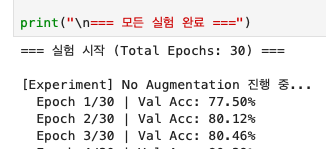

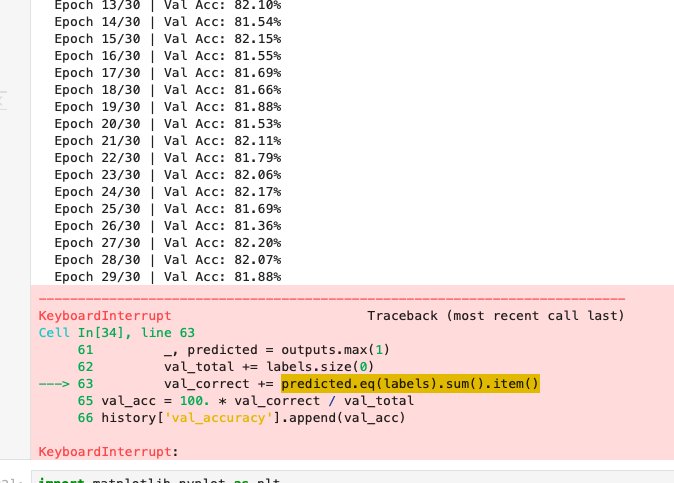

alcl게이 ㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠ

> 2턴째 한번만 더 갑니다....


